In [89]:
import cv2
import numpy as np

# Extracting the images and converting them from BGR to RGB 

In [91]:
original_image = "Change_Address.png"
original_read = cv2.imread(original_image, cv2.IMREAD_COLOR)
original_read = cv2.cvtColor(original_read, cv2.COLOR_BGR2RGB)


live_image = "Photo1.jpg"
live_read = cv2.imread(live_image, cv2.IMREAD_COLOR)
live_read = cv2.cvtColor(live_read, cv2.COLOR_BGR2RGB)

Text(0.5, 1.0, 'Live Image')

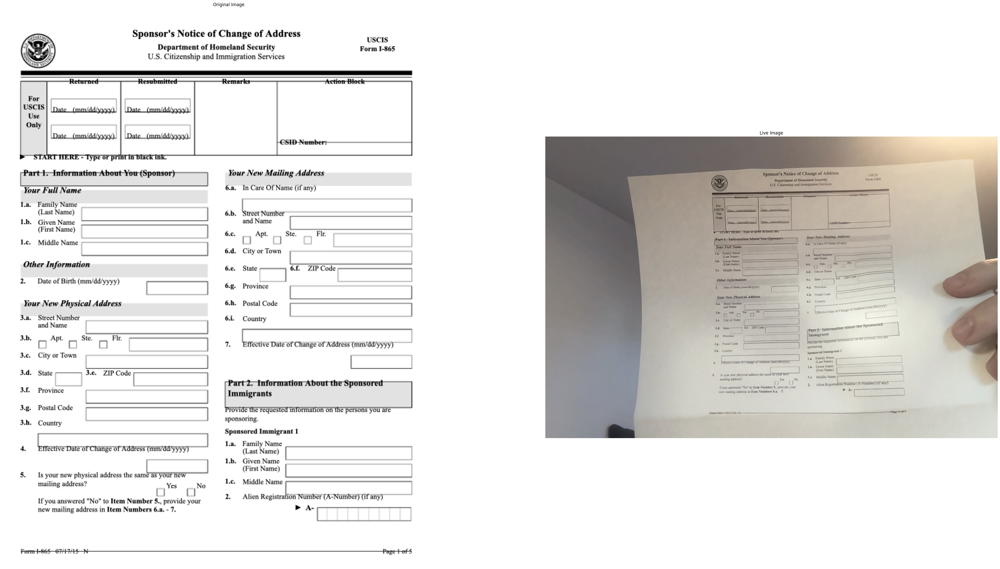

In [92]:
#Displaying the images
plt.figure(figsize = [50, 30])
plt.subplot(121); plt.axis("off"); plt.imshow(original_read); plt.title("Original Image")
plt.subplot(122); plt.axis("off"); plt.imshow(live_read); plt.title("Live Image")

# Initializing the ORB object, the keypoints, and the descriptors from each file

In [83]:
#Convert images to grayscale
original_gray = cv2.cvtColor(original_read, cv2.COLOR_BGR2GRAY)
live_gray = cv2.cvtColor(live_read, cv2.COLOR_BGR2GRAY)


MAX_FEATURES = 500
orb = cv2.ORB_create(MAX_FEATURES)
keypoints1, descriptors1 = orb.detectAndCompute(original_gray, None)
keypoints2, descriptors2 = orb.detectAndCompute(live_gray, None)



In [84]:
#Display the keypoints
original_copy = original_read.copy()
original_display = cv2.drawKeypoints(original_read, keypoints1, outImage=np.array([]), color = (255, 0 , 0), flags = 4)

live_copy = live_read.copy()
live_display = cv2.drawKeypoints(live_read, keypoints2, outImage=np.array([]), color = (255, 0, 0), flags = 4)


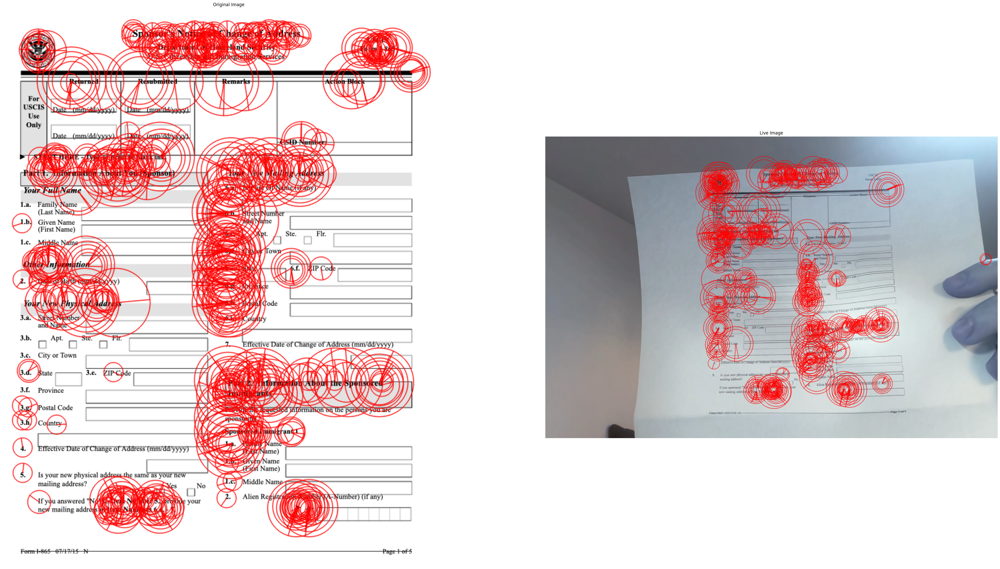

In [51]:
plt.figure(figsize = [50, 30])
plt.subplot(121); plt.imshow(original_display); plt.axis("off"); plt.title("Original Image");
plt.subplot(122); plt.imshow(live_display); plt.axis("off"); plt.title("Live Image");


## Selecting only the top 1% of matches

In [69]:
#Matching the features
matcher = cv2.DescriptorMatcher_create(cv2.DESCRIPTOR_MATCHER_BRUTEFORCE_HAMMING)
matches = list(matcher.match(descriptors1, descriptors2, None))

#Sorting them ascendendgly, by the least Hamming distance

matches.sort(key = lambda x: x.distance, reverse = False)

filtering_good_matches = int(len(matches) * 0.1)
matches = matches[:filtering_good_matches]


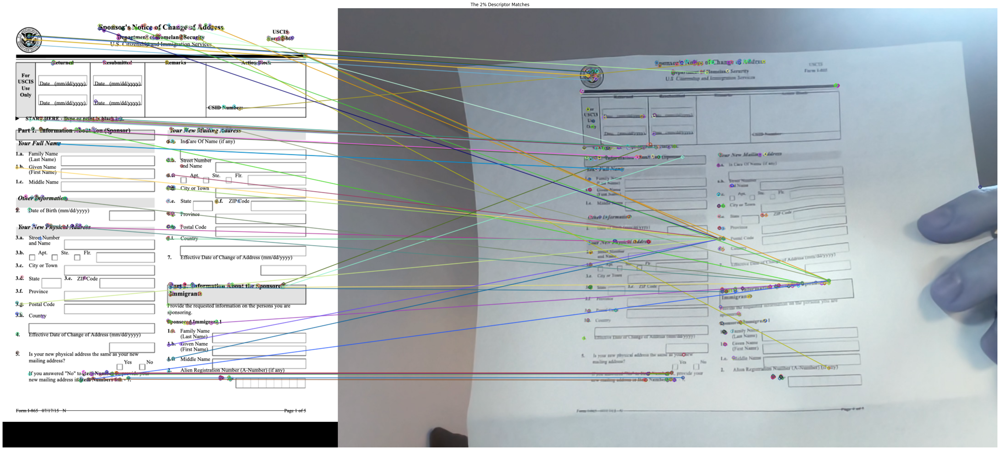

In [70]:
#Drawing the matches
im_matches = cv2.drawMatches(original_read, keypoints1, live_read, keypoints2, matches, outImg = None)

plt.figure(figsize = [50, 30])
plt.imshow(im_matches); plt.axis("off"); plt.title("The 2% Descriptor Matches");


In [85]:
points1 = np.zeros((len(matches), 2), dtype = np.float32)
points2 = np.zeros((len(matches), 2), dtype = np.float32)

## Extracting the location of good matches

In [75]:
for i, match in enumerate(matches):
    points1[i, :] = keypoints1[match.queryIdx].pt
    points2[i, :] = keypoints2[match.trainIdx].pt

#Find Homography using RANSAC
h, _ = cv2.findHomography(points2, points1, cv2.RANSAC)

((np.float64(-0.5), np.float64(731.5), np.float64(903.5), np.float64(-0.5)),
 Text(0.5, 1.0, 'Applying the Homography'))

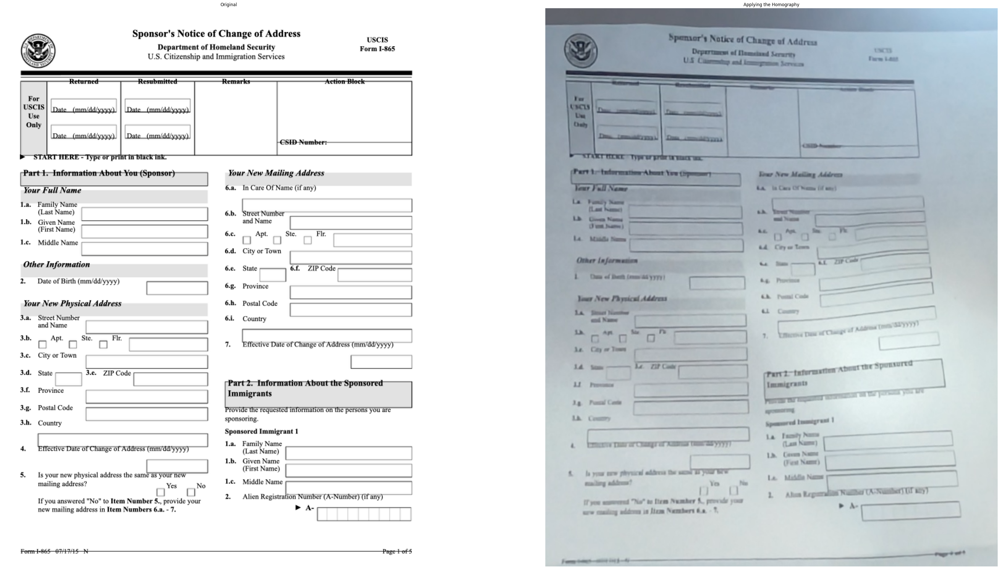

In [81]:
height, width, channels = original_read.shape

live_homographized = cv2.warpPerspective(live_read, h, (width, height))

plt.figure(figsize = [50,30]);
plt.subplot(121); plt.imshow(original_read); plt.axis("off"), plt.title("Original");
plt.subplot(122); plt.imshow(live_homographized); plt.axis("off"), plt.title("Applying the Homography")